# Imports

In [72]:
import os
import numpy as np
import pandas as pd
from scipy.io import wavfile
import seaborn as sns
import pandas as pd

import librosa
import librosa.display

import matplotlib.pyplot as plt
import IPython.display as ipd

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score, cohen_kappa_score, roc_auc_score, confusion_matrix, classification_report

import soundfile as sf

#sns.set(style="ticks", context="talk", rc={'figure.figsize':(20,8), 'figure.dpi':300})
#plt.style.use("dark_background")

In [4]:
path = 'data/samples/'

# Functions

In [5]:
def mean_mfccs(x):
    return [np.mean(feature) for feature in librosa.feature.mfcc(x)]

def parse_audio(x):
    return x.flatten('F')[:x.shape[0]] 

def get_audios(path):
    train_path = path
    train_file_names = os.listdir(train_path)
    
    samples = []
    for file_name in train_file_names:
        x, sr = sf.read(train_path + file_name)
        x = parse_audio(x)
        samples.append(mean_mfccs(x))
        
    return np.array(samples)

def get_samples(path, dataset):
    df = pd.read_csv(dataset)
    return get_audios(path), df['class'].values, df['procedence_file'].values

# Make CSV's

In [6]:
X, Y, procedence_file = get_samples(path, 'home_sound.csv')
df = pd.DataFrame(X)
df['class'] = Y
df['procedence_file'] = procedence_file
df.to_csv('home_sound_data.csv', index=False)

# Load data

In [301]:
df = pd.read_csv('home_sound_data.csv')
X = df[[str(i) for i in range(20)]].to_numpy()
Y = df['class'].to_numpy()

all_classes = np.unique(Y)

# Visualize data

Text(0.5, 1.0, 'Histogram of classes')

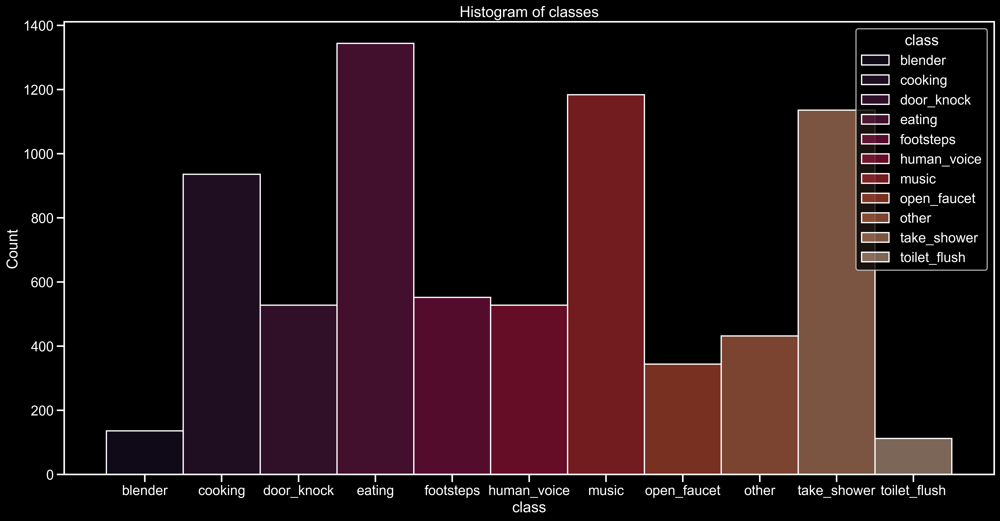

In [302]:
sns.set(style="ticks", context="talk", rc={'figure.figsize':(20,10)})
plt.style.use("dark_background")
sns.histplot(data=df, x='class', hue='class', palette='rocket')
plt.title('Histogram of classes')

Text(0, 0.5, 'PCA Component 1')

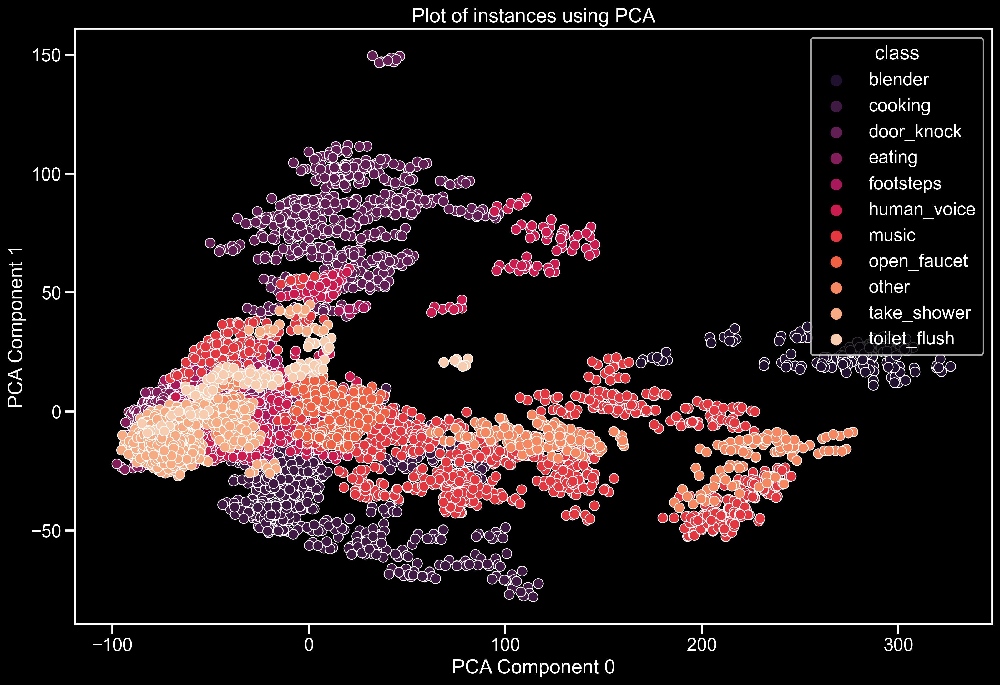

In [303]:
sns.set(style="ticks", context="talk", rc={'figure.figsize':(15,10)})
plt.style.use("dark_background")
pca = PCA(n_components=2)
pca.fit(X)
new_X = pca.transform(X)
dfPCA = pd.DataFrame(new_X)
dfPCA['class'] = Y
sns.scatterplot(data=dfPCA, x=0, y=1, hue='class', palette='rocket', sizes=(100, 10))
plt.title('Plot of instances using PCA')
plt.xlabel('PCA Component 0')
plt.ylabel('PCA Component 1')

# Make k-folds

In [304]:
skf = StratifiedShuffleSplit(n_splits=10, test_size=0.2)
x_train = []
x_test = []
y_train = []
y_test = []

for train_index, test_index in skf.split(X, Y):
    x_train.append(X[train_index])
    y_train.append(Y[train_index])
    x_test.append(X[test_index])
    y_test.append(Y[test_index])

# Models

In [305]:
def make_class_by_threshold(threshold, probas, classes):
    y_pred = []
    for prob in probas:
        indmax = np.argmax(prob)
        if prob[indmax] >= 0.8:
            y_pred.append(classes[indmax])
        else:
            y_pred.append('other')
            
    return y_pred

In [306]:
def fit_model(model, x_train, y_train, x_test, y_test, classes, threshold):
    results = {'Accuracy': [], 'Accuracy threshold': [], 'F1': [], 'F1 threshold': [], 'K': [], 
               'K threshold': [], 'AUC': []}
    cms = []
    cms_threshold = []
    for i in range(len(x_train)):
        model.fit(x_train[i], y_train[i])
        y_pred = model.predict(x_test[i])
        probas = model.predict_proba(x_test[i])
        new_y_pred = make_class_by_threshold(threshold, probas, classes)
        results['Accuracy'].append(accuracy_score(y_test[i], y_pred))
        results['Accuracy threshold'].append(accuracy_score(y_test[i], new_y_pred))
        results['F1'].append(f1_score(y_test[i], y_pred, average='weighted'))
        results['F1 threshold'].append(f1_score(y_test[i], new_y_pred, average='weighted'))
        results['K'].append(cohen_kappa_score(y_test[i], y_pred))
        results['K threshold'].append(cohen_kappa_score(y_test[i], new_y_pred))
        results['AUC'].append(roc_auc_score(y_test[i], probas, multi_class='ovr'))
        cms.append(confusion_matrix(y_test[i], y_pred))
        cms_threshold.append(confusion_matrix(y_test[i], new_y_pred))
        
    m = np.zeros(cms[0].shape)    
    m_threshold = np.zeros(cms_threshold[0].shape)  
    for i in range(len(cms)):
        m += cms[i]
        m_threshold += cms_threshold[i]
        
    m /= len(cms)
    m_threshold /= len(cms_threshold)
    return results, m, m_threshold

In [307]:
knn_bagging = BaggingClassifier(KNeighborsClassifier(n_neighbors=5), n_estimators=10, n_jobs=2, 
                                max_samples=0.5, max_features=0.5)

results_knn_bagging = fit_model(knn_bagging, x_train, y_train, x_test, y_test, all_classes, 0.8)

In [308]:
svm_bagging = BaggingClassifier(SVC(kernel='linear'), n_estimators=10, n_jobs=2, 
                                max_samples=0.5, max_features=0.5)

results_svm_bagging = fit_model(svm_bagging, x_train, y_train, x_test, y_test, all_classes, 0.8)

In [309]:
nn = MLPClassifier(max_iter=300, hidden_layer_sizes=(128, 256, 512, 256, 128))
results_nn = fit_model(nn, x_train, y_train, x_test, y_test, all_classes, 0.8)

In [310]:
gb = GradientBoostingClassifier(n_estimators=100)
results_gb = fit_model(gb, x_train, y_train, x_test, y_test, all_classes, 0.8)

In [311]:
random_forest = RandomForestClassifier(n_estimators=100, n_jobs=2)
results_rf = fit_model(random_forest, x_train, y_train, x_test, y_test, all_classes, 0.8)

In [312]:
results_df = {'Model': [], 'Accuracy': [], 'Accuracy threshold': [], 'F1': [], 'F1 threshold': [], 'K': [], 
               'K threshold': [], 'AUC': []}

results_df['Model'].append('Random Forest')
for metric in list(results_rf[0].keys()):
    results_df[metric].append(np.mean(results_rf[0][metric]))
    
results_df['Model'].append('GradientBoost')
for metric in list(results_gb[0].keys()):
    results_df[metric].append(np.mean(results_gb[0][metric]))
    
results_df['Model'].append('Neuronal Network')
for metric in list(results_nn[0].keys()):
    results_df[metric].append(np.mean(results_nn[0][metric]))
    
results_df['Model'].append('SVM Bagging')
for metric in list(results_svm_bagging[0].keys()):
    results_df[metric].append(np.mean(results_svm_bagging[0][metric]))

results_df['Model'].append('KNN Bagging')
for metric in list(results_knn_bagging[0].keys()):
    results_df[metric].append(np.mean(results_knn_bagging[0][metric]))
    
results_df = pd.DataFrame(results_df)

# Results of Models

In [313]:
results_df.head()

,Model,Accuracy,Accuracy threshold,F1,F1 threshold,K,K threshold,AUC
0,Random Forest,0.995646,0.835038,0.995620,0.869688,0.995020,0.813541,0.999987
1,GradientBoost,0.988528,0.964202,0.988461,0.967123,0.986873,0.959144,0.999850
2,Neuronal Network,0.984036,0.967243,0.983934,0.969429,0.981728,0.962641,0.999878
3,SVM Bagging,0.943469,0.766413,0.942324,0.817635,0.935206,0.737071,0.991679
4,KNN Bagging,0.992122,0.851348,0.991996,0.882844,0.990986,0.831929,0.999962


# Confusion Matrix of Random Forest

Text(0.5, 1.0, 'Random Forest Confusion Matrix')

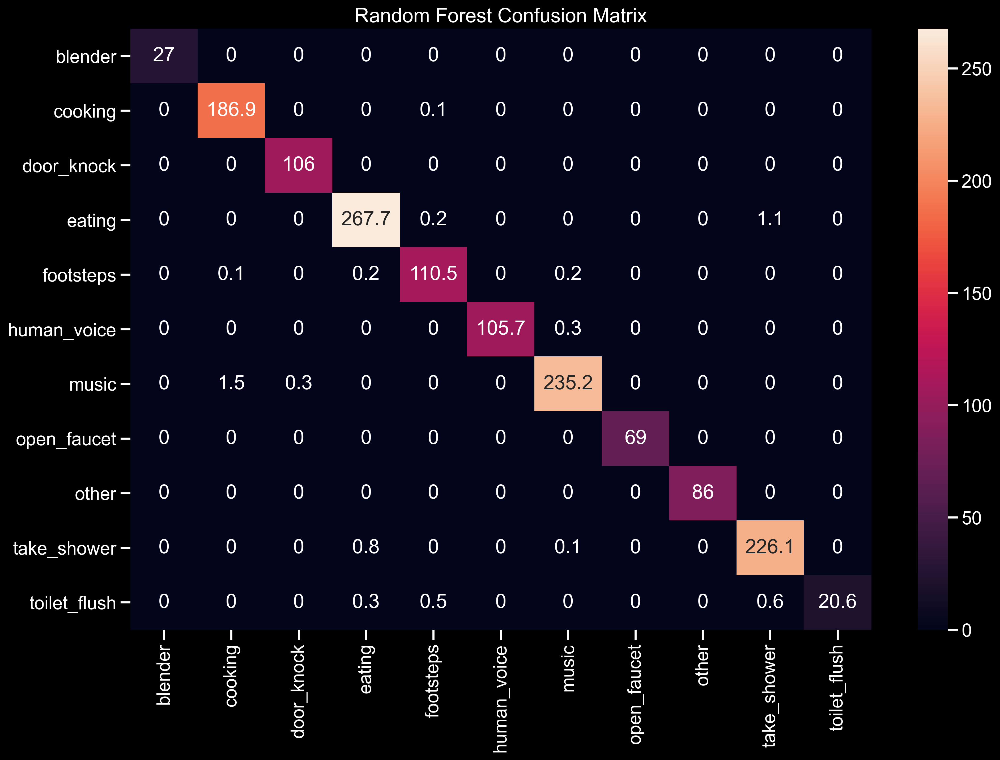

In [314]:
sns.heatmap(results_rf[1], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Random Forest Confusion Matrix')

Text(0.5, 1.0, 'Random Forest with Threshold Confusion Matrix')

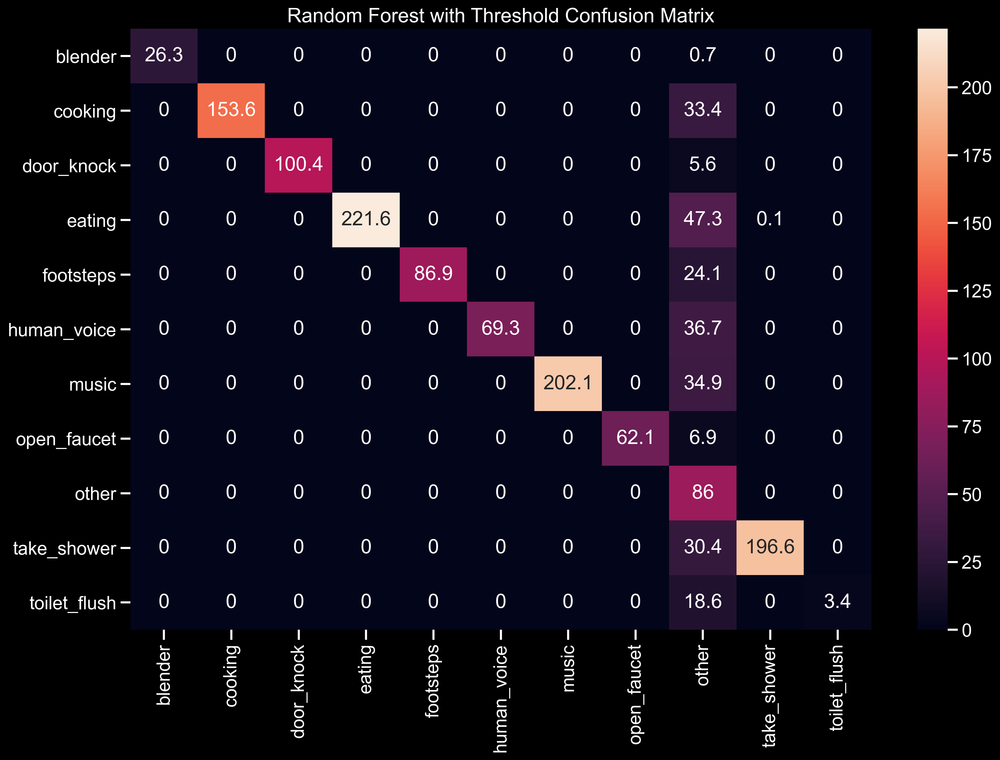

In [315]:
sns.heatmap(results_rf[2], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Random Forest with Threshold Confusion Matrix')

# Confusion Matrix of Gradient Boost

Text(0.5, 1.0, 'Gradient Boost Confusion Matrix')

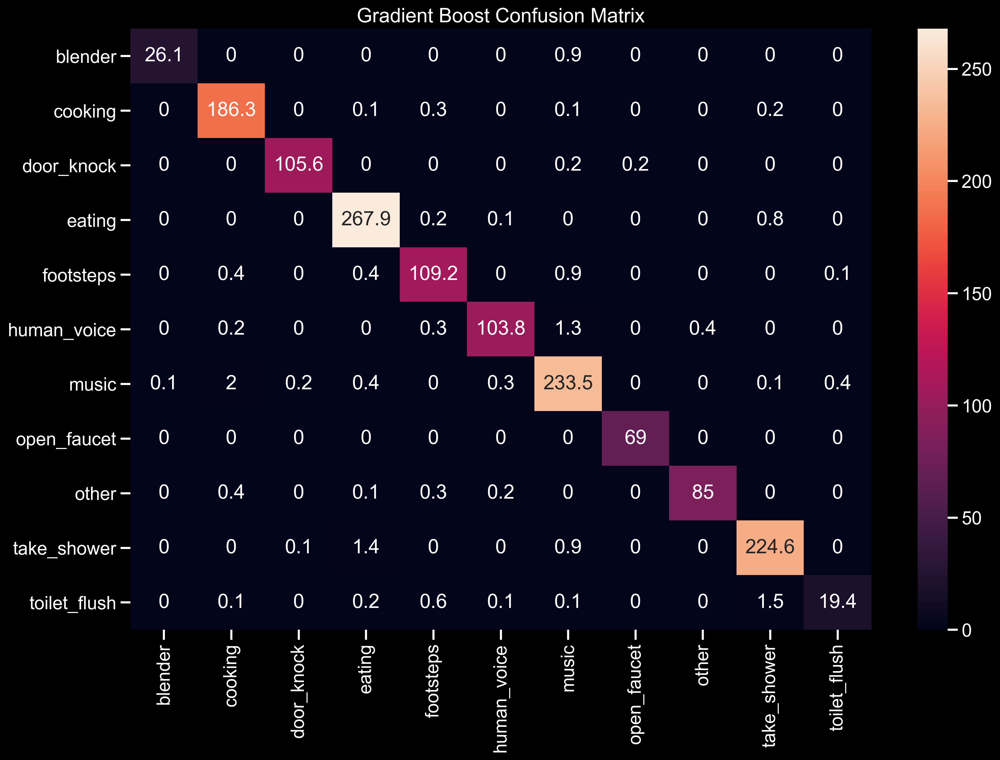

In [316]:
sns.heatmap(results_gb[1], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Gradient Boost Confusion Matrix')

Text(0.5, 1.0, 'Gradient Boost with Threshold Confusion Matrix')

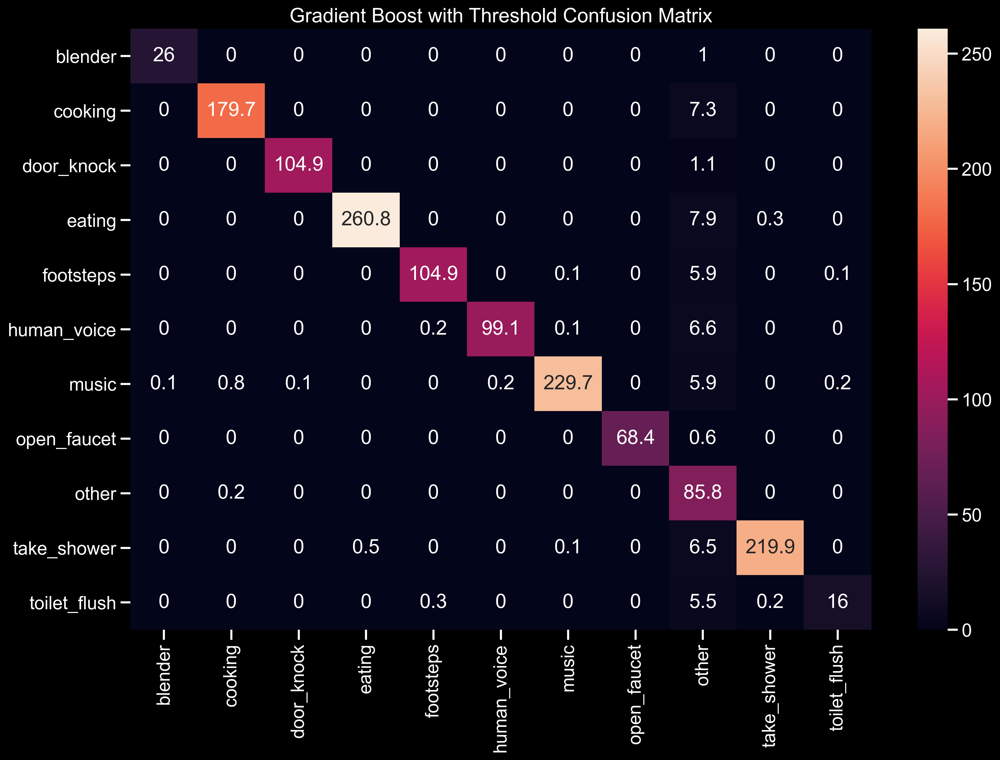

In [317]:
sns.heatmap(results_gb[2], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Gradient Boost with Threshold Confusion Matrix')

# Confusion Matrix of Neuronal Network

Text(0.5, 1.0, 'Neuronal Network Confusion Matrix')

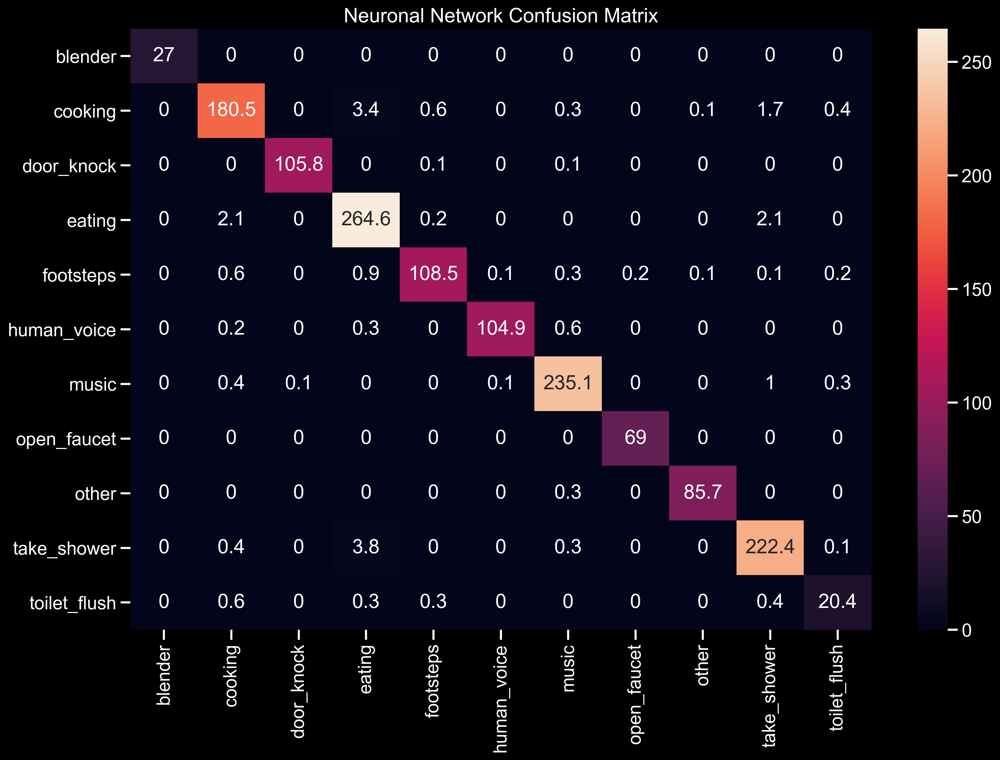

In [318]:
sns.heatmap(results_nn[1], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Neuronal Network Confusion Matrix')

Text(0.5, 1.0, 'Neuronal Network with Threshold Confusion Matrix')

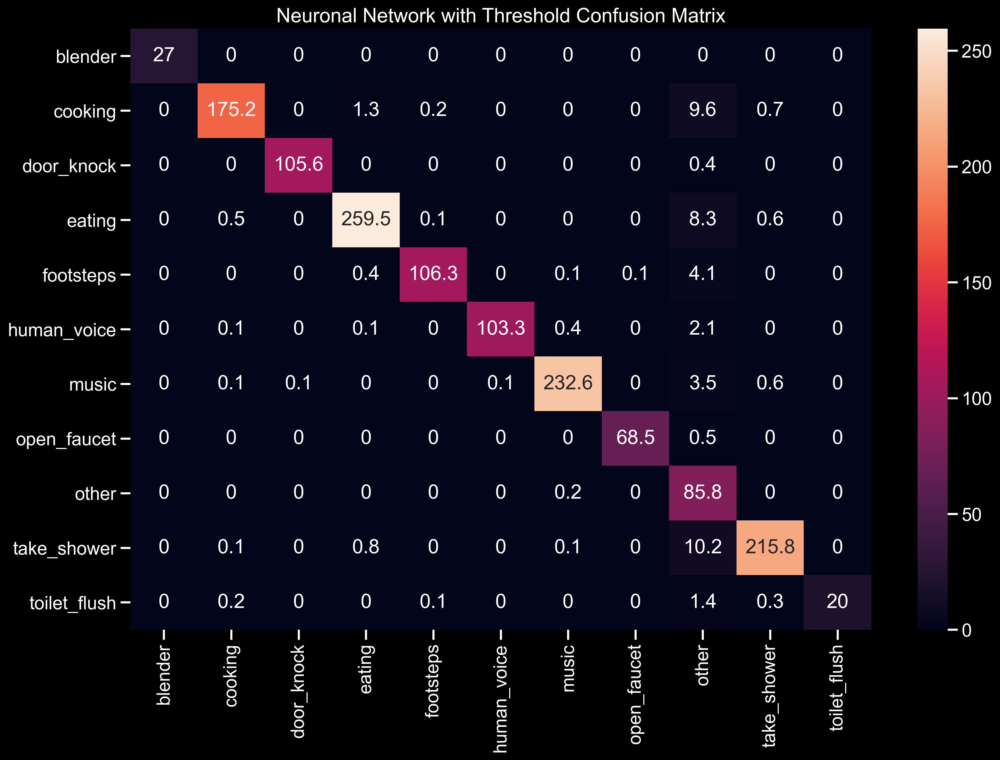

In [319]:
sns.heatmap(results_nn[2], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('Neuronal Network with Threshold Confusion Matrix')

# Confusion Matrix of SVM Bagging

Text(0.5, 1.0, 'SVM Bagging Confusion Matrix')

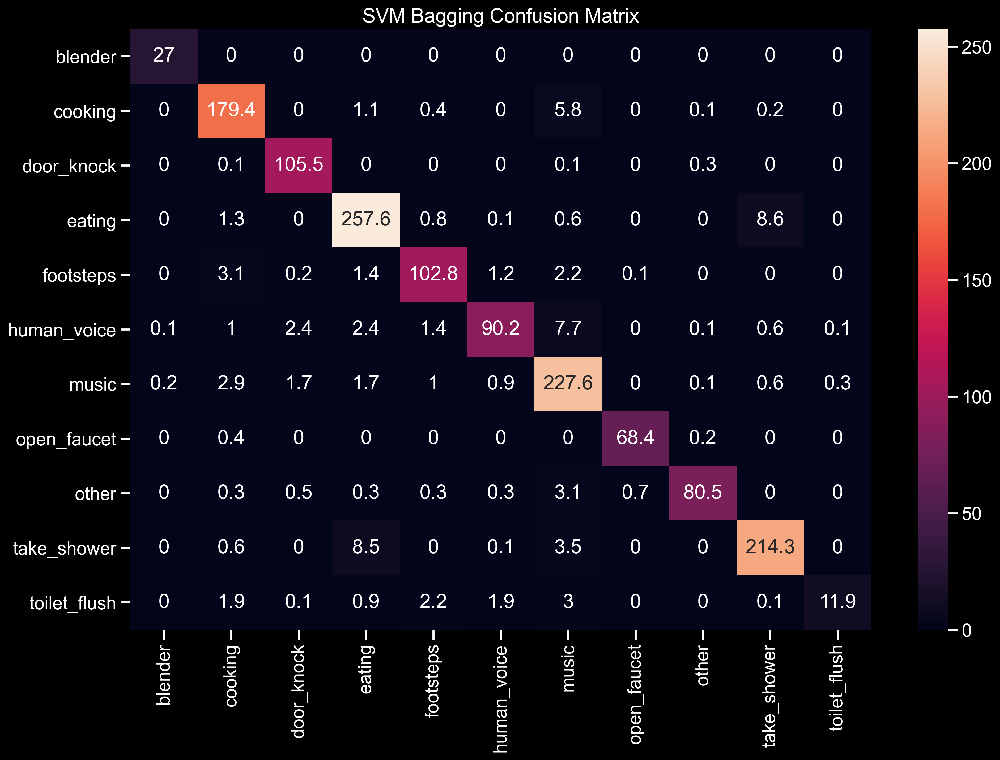

In [320]:
sns.heatmap(results_svm_bagging[1], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('SVM Bagging Confusion Matrix')

Text(0.5, 1.0, 'SVM Bagging with Threshold Confusion Matrix')

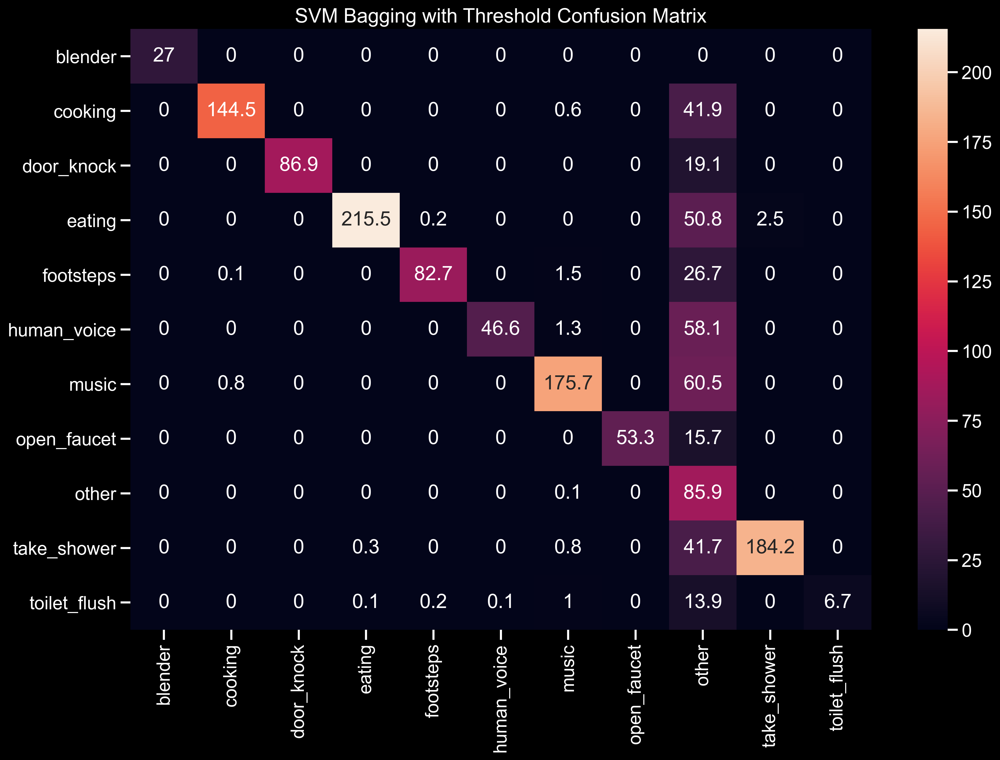

In [321]:
sns.heatmap(results_svm_bagging[2], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('SVM Bagging with Threshold Confusion Matrix')

# Confusion Matrix of KNN Bagging

Text(0.5, 1.0, 'KNN Bagging Confusion Matrix')

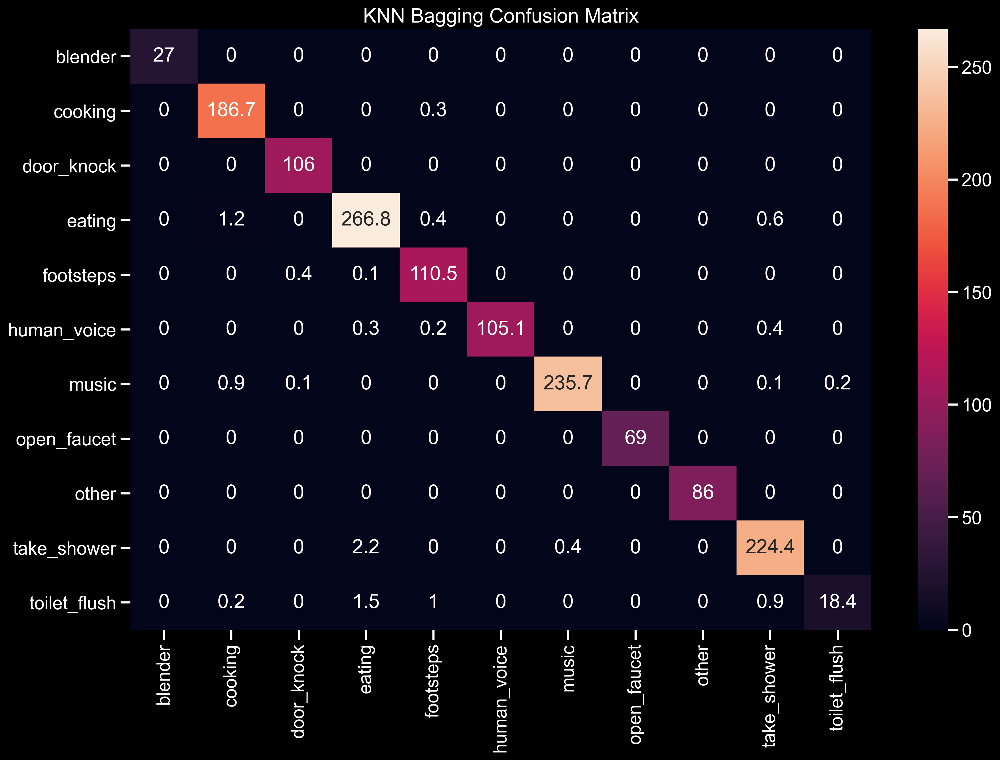

In [322]:
sns.heatmap(results_knn_bagging[1], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('KNN Bagging Confusion Matrix')

Text(0.5, 1.0, 'KNN Bagging with Threshold Confusion Matrix')

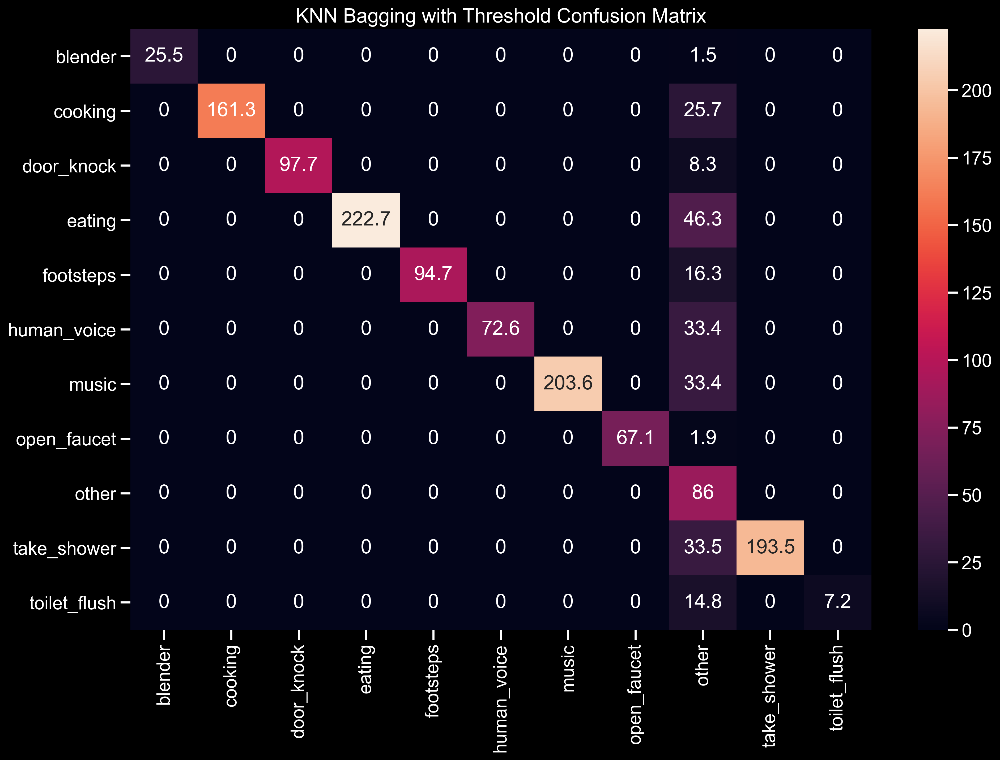

In [323]:
sns.heatmap(results_knn_bagging[2], annot=True, fmt='g', xticklabels=all_classes, yticklabels=all_classes)
plt.title('KNN Bagging with Threshold Confusion Matrix')

# Test

In [324]:
df_test = pd.read_csv('home_sound_test.csv')
X_test = get_audios('data/test/01/')
Y_test = df_test['class']

              precision    recall  f1-score   support

     cooking       0.33      0.40      0.36         5
      eating       0.52      0.43      0.47        69
   footsteps       0.17      0.62      0.27         8
 human_voice       0.00      0.00      0.00        14
 open_faucet       0.00      1.00      0.00         0
       other       0.24      0.16      0.19        31

    accuracy                           0.33       127
   macro avg       0.21      0.44      0.22       127
weighted avg       0.36      0.33      0.33       127



Text(0.5, 1.0, 'Neuronal Network with Threshold Confusion Matrix')

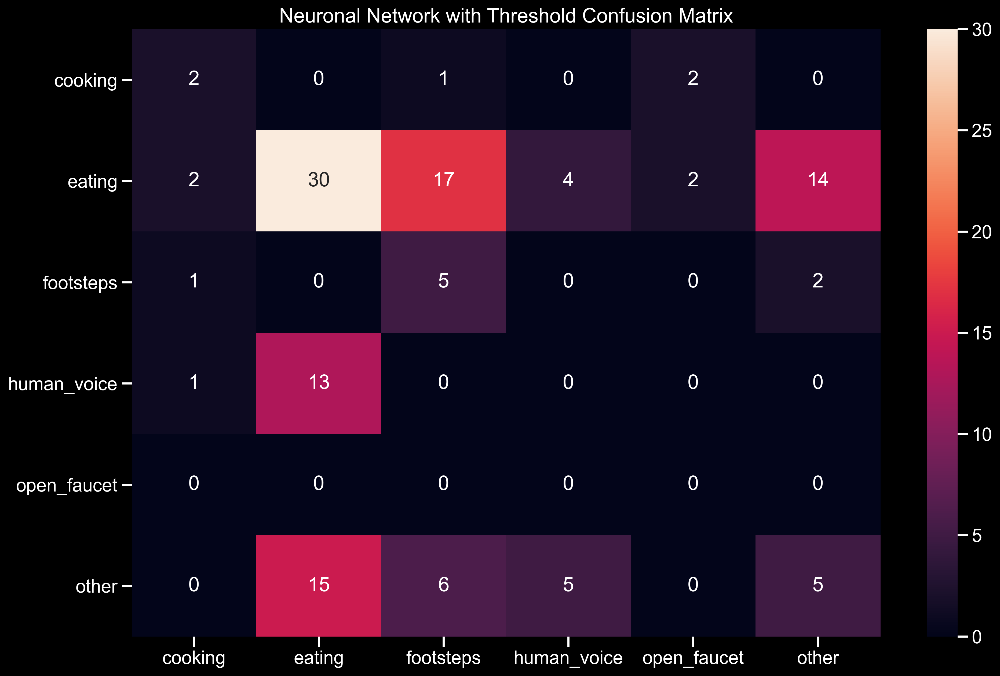

In [325]:
y_pred_test = make_class_by_threshold(0.8, nn.predict_proba(X_test), all_classes)
classes = sorted(list(set(list(np.unique(Y_test)) + list(np.unique(y_pred_test)))))
print(classification_report(Y_test, y_pred_test, zero_division=1))
sns.heatmap(confusion_matrix(Y_test, y_pred_test), annot=True, fmt='g', xticklabels=classes, 
            yticklabels=classes)
plt.title('Neuronal Network with Threshold Confusion Matrix')

              precision    recall  f1-score   support

     cooking       0.29      0.40      0.33         5
      eating       0.52      0.38      0.44        69
   footsteps       0.25      0.25      0.25         8
 human_voice       0.00      0.00      0.00        14
       other       0.35      0.55      0.42        31
toilet_flush       0.00      1.00      0.00         0

    accuracy                           0.37       127
   macro avg       0.23      0.43      0.24       127
weighted avg       0.39      0.37      0.37       127



Text(0.5, 1.0, 'GB with Threshold Confusion Matrix')

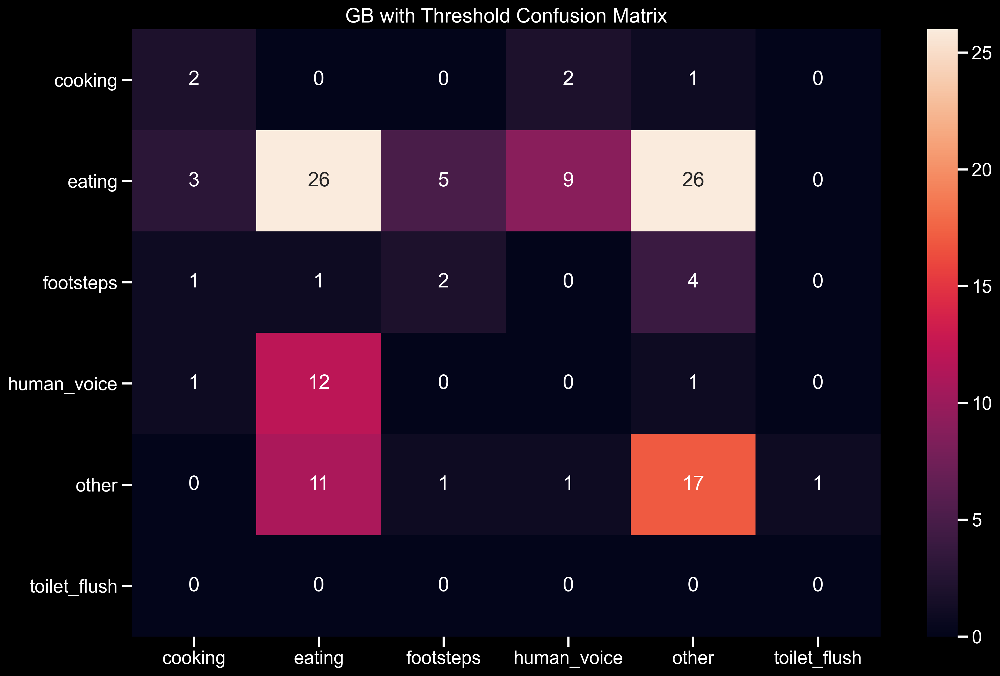

In [326]:
y_pred_test = make_class_by_threshold(0.8, gb.predict_proba(X_test), all_classes)
classes = sorted(list(set(list(np.unique(Y_test)) + list(np.unique(y_pred_test)))))
print(classification_report(Y_test, y_pred_test, zero_division=1))
sns.heatmap(confusion_matrix(Y_test, y_pred_test), annot=True, fmt='g', xticklabels=classes, 
            yticklabels=classes)
plt.title('GB with Threshold Confusion Matrix')

              precision    recall  f1-score   support

     cooking       0.33      0.20      0.25         5
      eating       0.50      0.09      0.15        69
   footsteps       1.00      0.00      0.00         8
 human_voice       1.00      0.00      0.00        14
       other       0.26      0.94      0.41        31

    accuracy                           0.28       127
   macro avg       0.62      0.24      0.16       127
weighted avg       0.52      0.28      0.19       127



Text(0.5, 1.0, 'RF with Threshold Confusion Matrix')

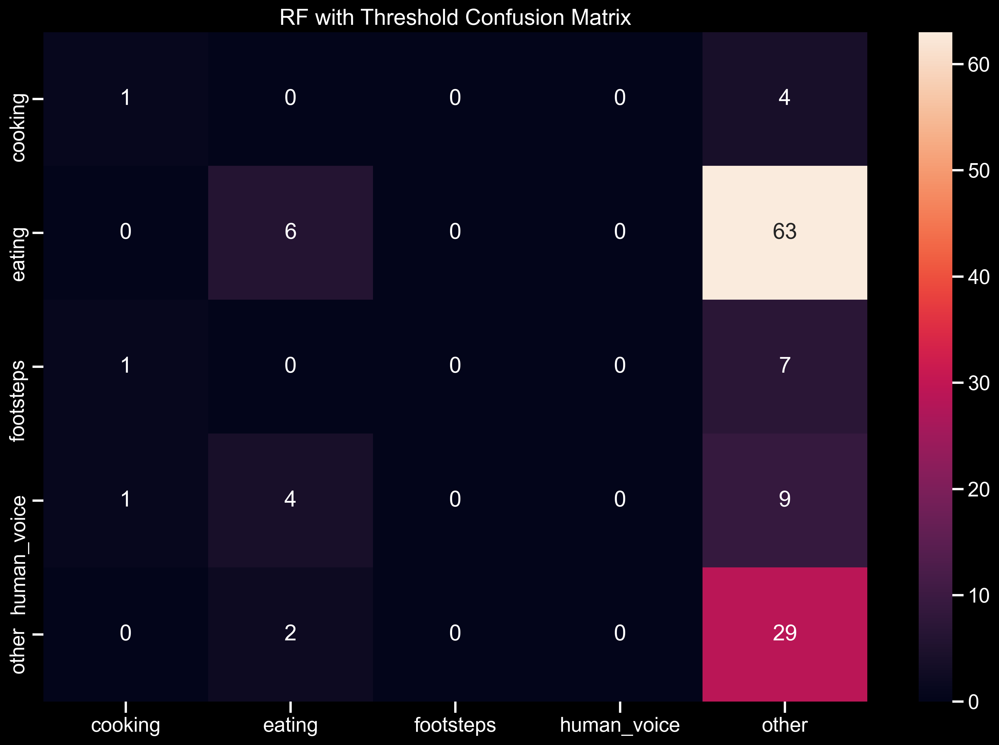

In [327]:
y_pred_test = make_class_by_threshold(0.8, random_forest.predict_proba(X_test), all_classes)
classes = sorted(list(set(list(np.unique(Y_test)) + list(np.unique(y_pred_test)))))
print(classification_report(Y_test, y_pred_test, zero_division=1))
sns.heatmap(confusion_matrix(Y_test, y_pred_test), annot=True, fmt='g', xticklabels=classes, 
            yticklabels=classes)
plt.title('RF with Threshold Confusion Matrix')

              precision    recall  f1-score   support

     cooking       0.33      0.40      0.36         5
      eating       0.52      0.19      0.28        69
   footsteps       0.00      0.00      0.00         8
 human_voice       1.00      0.00      0.00        14
       other       0.27      0.84      0.41        31

    accuracy                           0.32       127
   macro avg       0.43      0.29      0.21       127
weighted avg       0.47      0.32      0.27       127



Text(0.5, 1.0, 'SVM with Threshold Confusion Matrix')

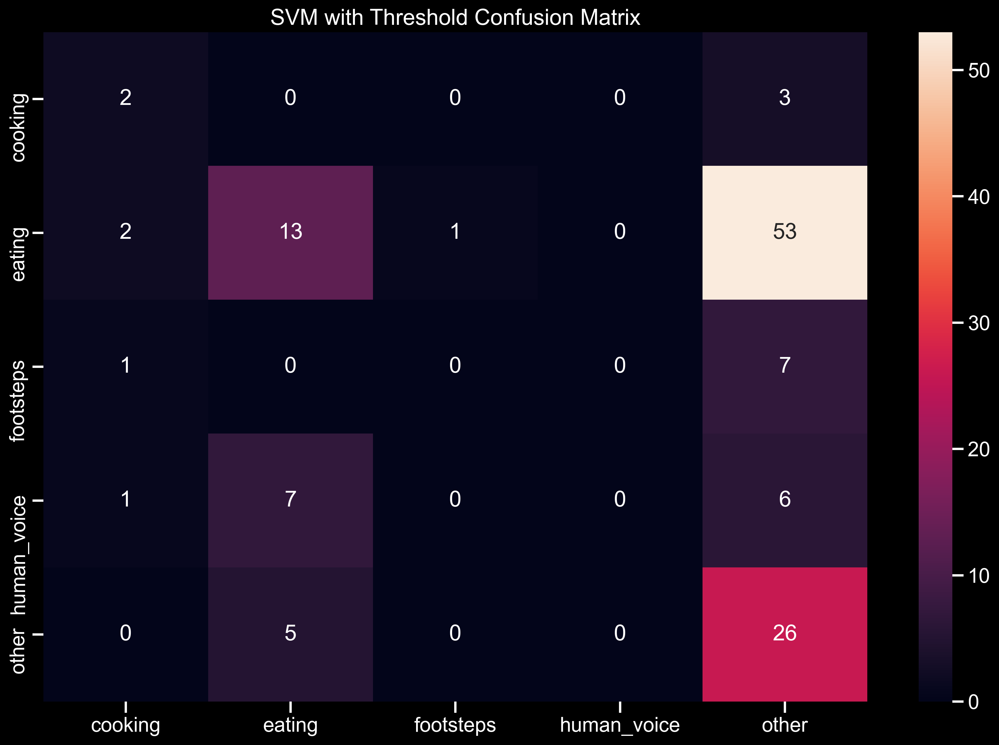

In [328]:
y_pred_test = make_class_by_threshold(0.8, svm_bagging.predict_proba(X_test), all_classes)
classes = sorted(list(set(list(np.unique(Y_test)) + list(np.unique(y_pred_test)))))
print(classification_report(Y_test, y_pred_test, zero_division=1))
sns.heatmap(confusion_matrix(Y_test, y_pred_test), annot=True, fmt='g', xticklabels=classes, 
            yticklabels=classes)
plt.title('SVM with Threshold Confusion Matrix')

              precision    recall  f1-score   support

     cooking       0.40      0.40      0.40         5
      eating       0.72      0.19      0.30        69
   footsteps       1.00      0.00      0.00         8
 human_voice       1.00      0.00      0.00        14
       music       0.00      1.00      0.00         0
       other       0.29      0.94      0.44        31

    accuracy                           0.35       127
   macro avg       0.57      0.42      0.19       127
weighted avg       0.65      0.35      0.29       127



Text(0.5, 1.0, 'KNN with Threshold Confusion Matrix')

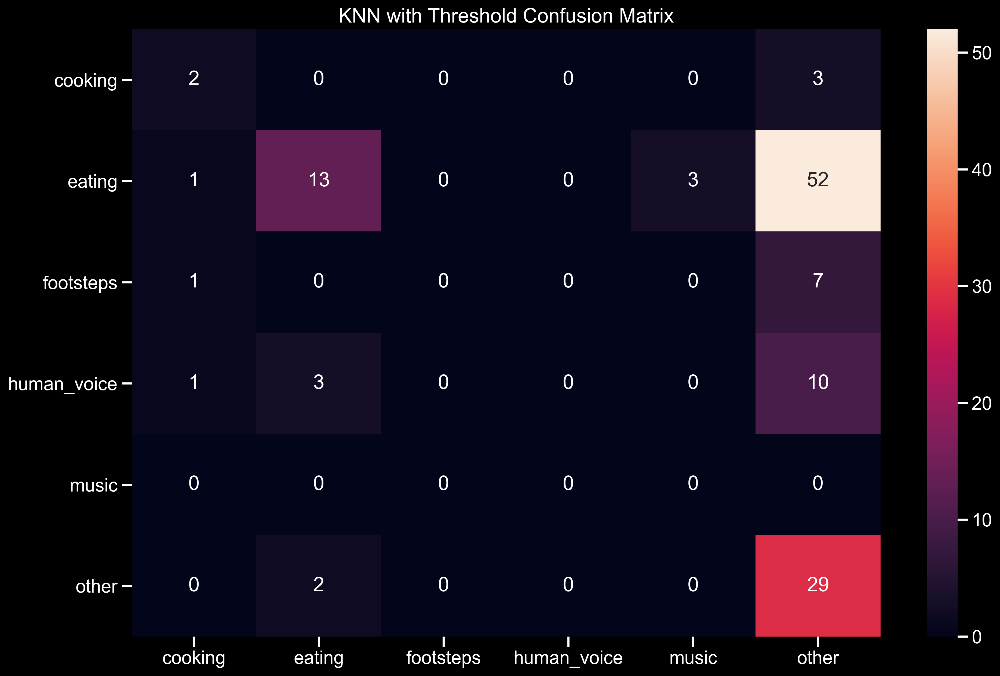

In [329]:
y_pred_test = make_class_by_threshold(0.8, knn_bagging.predict_proba(X_test), all_classes)
classes = sorted(list(set(list(np.unique(Y_test)) + list(np.unique(y_pred_test)))))
print(classification_report(Y_test, y_pred_test, zero_division=1))
sns.heatmap(confusion_matrix(Y_test, y_pred_test), annot=True, fmt='g', xticklabels=classes, 
            yticklabels=classes)
plt.title('KNN with Threshold Confusion Matrix')